# bird classification

Following https://www.kaggle.com/code/emreiekyurt/bird-species-classification-with-deep-learning

In [159]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import Counter
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
import random
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
import tensorflow as tf

In [160]:
ROOT_DATASET_DIR = "./data/" # 
# ROOT_DATASET_DIR = "/home/sam/datasets/pnw_birds/" # Sam - Subset for just 4 PNW bird classes

In [161]:
#walk through the directory and list the numbers of files
for dirpath, dirnames, filenames in os.walk(ROOT_DATASET_DIR,):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")
    # print(f"There are {len(filenames)} images in {dirpath}")

There are 3 directories and 0 images in ./data/
There are 70 directories and 0 images in ./data/train
There are 0 directories and 82 images in ./data/train/Albatross
There are 0 directories and 109 images in ./data/train/Grosbeak
There are 0 directories and 28 images in ./data/train/Creeper
There are 0 directories and 28 images in ./data/train/Lark
There are 0 directories and 55 images in ./data/train/Catbird
There are 0 directories and 109 images in ./data/train/Oriole
There are 0 directories and 28 images in ./data/train/Mallard
There are 0 directories and 82 images in ./data/train/Jay
There are 0 directories and 28 images in ./data/train/Puffin
There are 0 directories and 28 images in ./data/train/Flicker
There are 0 directories and 28 images in ./data/train/Mockingbird
There are 0 directories and 28 images in ./data/train/Guillemot
There are 0 directories and 28 images in ./data/train/Fulmar
There are 0 directories and 28 images in ./data/train/Ani
There are 0 directories and 55 im

In [162]:
TRAIN_CLASS_COUNT = len(os.listdir(ROOT_DATASET_DIR + "train"))
TEST_CLASS_COUNT = len(os.listdir(ROOT_DATASET_DIR + "test"))
assert TRAIN_CLASS_COUNT == TEST_CLASS_COUNT
print(TRAIN_CLASS_COUNT)


70


In [163]:
def view_random_image(target_dir, target_class):
  # setting up the image directory
  target_folder = target_dir + target_class

  #get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)

  #read image and plotting it
  img = mpimg.imread(target_folder + "/" + random_image[0] )
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")

  print(f"Image shape: {img.shape}")
  
  return img

In [164]:
# img = view_random_image(ROOT_DATASET_DIR + "train/", "crow")

In [165]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Activation, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential

In [166]:
# train_dir = "./data/train/"
# test_dir = "./data/test/"
# val_dir = "./data/test/" # todo if different

# Sam built dataset just crows, finches and sparrows

train_dir = ROOT_DATASET_DIR + "train/"
test_dir = ROOT_DATASET_DIR + "test/"
val_dir = ROOT_DATASET_DIR + "val/" #

In [167]:
# preprocess_input = keras.applications.inception_v3.preprocess_input
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

# train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator()
valid_datagen = ImageDataGenerator()
train_datagen = ImageDataGenerator()

# train_datagen = ImageDataGenerator(
    # preprocessing_function=data_augmentation,
    # rescale=1./255,           # Rescale the pixel values (for normalization) # not same time as preprocess function
    # rotation_range=10,        # Degree range for random rotations
    # width_shift_range=0.1,    # Range (as a fraction of total width) for horizontal shifts
    # height_shift_range=0.1,   # Range (as a fraction of total height) for vertical shifts
    # shear_range=0.1,          # Shear Intensity (Shear angle in counter-clockwise direction)
    # zoom_range=0.1,           # Range for random zoom
    # horizontal_flip=True,     # Randomly flip inputs horizontally
    # fill_mode='nearest'       # Strategy to fill newly created pixels after a rotation or a width/height shift
# )


# test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
# valid_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# data transfer from directories to batches
img_size = 224
print('Loading Training')
train_data = train_datagen.flow_from_directory(
    directory = train_dir,
    batch_size= 32,
    target_size= (img_size,img_size),
    class_mode = "categorical")

print('Loading Validation')
val_data = valid_datagen.flow_from_directory(
    directory = val_dir,
    batch_size = 32,
    target_size = (img_size,img_size),
    class_mode = "categorical")

print('Loading Test')
test_data = test_datagen.flow_from_directory(
    directory = test_dir,
    batch_size = 32,
    target_size = (img_size,img_size),
    class_mode = "categorical",

    )



Loading Training
Found 5464 images belonging to 70 classes.
Loading Validation
Found 530 images belonging to 70 classes.


Loading Test
Found 5794 images belonging to 70 classes.


In [168]:
# def load_class_names():
#     data = {}
#     with open("./kaggle/CUB_200_2011/classes.txt", 'r') as file:
#         for line in file:
#             parts = line.strip().split(' ')
#             if len(parts) == 2:
#                 id, class_name = parts
#                 data[int(id)] = class_name
#     return data

# def load_group_names_from_image_id():
#     data = {}
#     with open("./group_classes.txt", 'r') as file:
#         for line in file:
#             parts = line.strip().split(' ')
#             if len(parts) == 2:
#                 id, class_name = parts
#                 data[int(id)] = class_name
#     return data

# def load_group_names():
#     # data = {}
#     group_name_set = set()
#     with open("./group_classes.txt", 'r') as file:
#         for line in file:
#             parts = line.strip().split(' ')
#             if len(parts) == 2:
#                 id, class_name = parts
#                 # data[int(id)] = class_name
#                 group_name_set.add(class_name)
#     return sorted(group_name_set) # Assume group names is sorted alphabetically

# class_names = load_class_names()
# group_names = load_group_names()
# group_names_from_image_id = load_group_names_from_image_id()
# print(class_names[140])
# print(group_names_from_image_id[140])
# print(group_names[69], len(group_names))

# print(train_data.)

# group_names = ["crow", "finch", "junco", "sparrow"]
group_names = sorted(os.listdir(train_dir))
print(group_names)


['Albatross', 'Ani', 'Auklet', 'Blackbird', 'Bobolink', 'Bunting', 'Cardinal', 'Catbird', 'Chat', 'Cormorant', 'Cowbird', 'Creeper', 'Crow', 'Cuckoo', 'Finch', 'Flicker', 'Flycatcher', 'Frigatebird', 'Fulmar', 'Gadwall', 'Geococcyx', 'Goldfinch', 'Grackle', 'Grebe', 'Grosbeak', 'Guillemot', 'Gull', 'Hummingbird', 'Jaeger', 'Jay', 'Junco', 'Kingbird', 'Kingfisher', 'Kittiwake', 'Lark', 'Loon', 'Mallard', 'Meadowlark', 'Merganser', 'Mockingbird', 'Nighthawk', 'Nutcracker', 'Nuthatch', 'Oriole', 'Ovenbird', 'Pelican', 'Pewee', 'Pipit', 'Puffin', 'Raven', 'Redstart', 'Sayornis', 'Shrike', 'Sparrow', 'Starling', 'Swallow', 'Tanager', 'Tern', 'Thrasher', 'Towhee', 'Violetear', 'Vireo', 'Warbler', 'Waterthrush', 'Waxwing', 'Widow', 'Will', 'Woodpecker', 'Wren', 'Yellowthroat']


In [169]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomBrightness(factor=0.2),
    tf.keras.layers.RandomContrast(factor=[0.8,0.1]),
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.1),
    # tf.keras.layers.RandomTranslation(0.1, 0.1),
    tf.keras.layers.RandomZoom([-0.3,0.6]),
    tf.keras.layers.GaussianNoise(stddev=1.4),
], name = "data_augmentation")


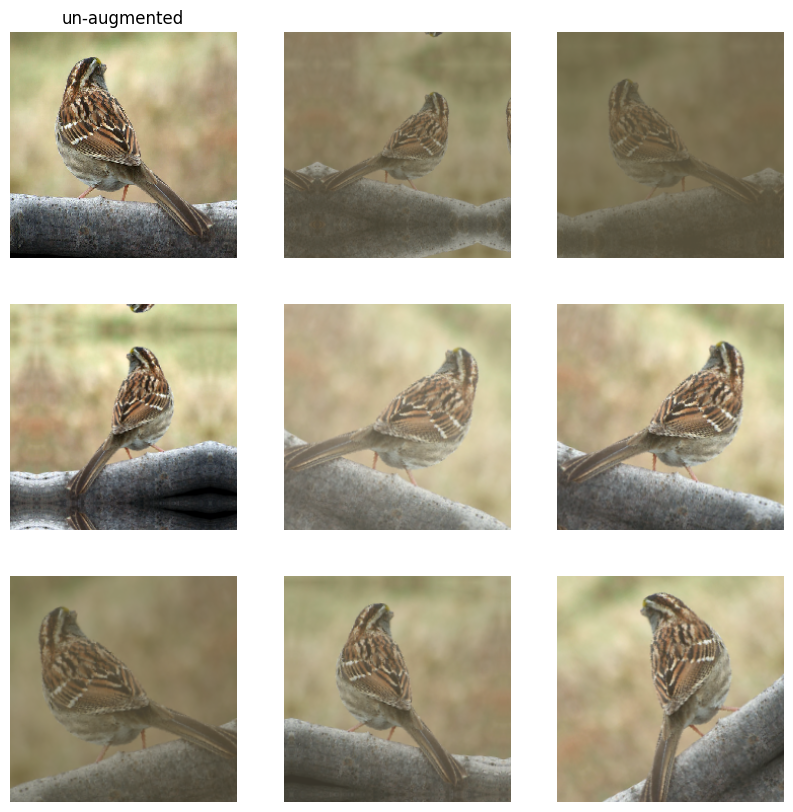

In [170]:
image, labels = next(train_data)
plt.figure(figsize=(10, 10))
first_image = image[0]
ax = plt.subplot(3, 3, 0 + 1)
plt.imshow(first_image / 255)
plt.axis('off')
plt.title('un-augmented')
for i in range(1,9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

0.0 255.0 (224, 224, 3)


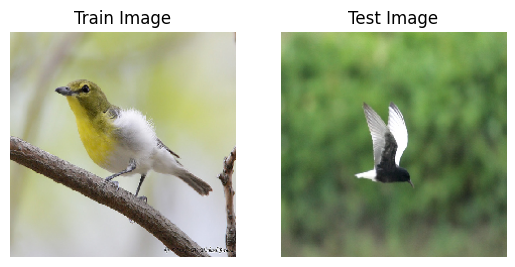

In [171]:
# Select the first image in the batch
train_images, labels = next(train_data)
train_image = train_images[1]
print(train_image.min(), train_image.max(), train_image.shape)

test_images, test_labels = next(test_data)
test_image = test_images[1]

# The images are rescaled, so we need to rescale back to display properly
plt.subplot(121)
plt.imshow(train_image.astype("uint8"))
# plt.imshow((train_image + 1)/2) # -1 to 1 moved to 0 - 1
plt.title("Train Image")
plt.axis('off')
# plt.show()

plt.subplot(122)
plt.imshow(test_image.astype("uint8"))
# plt.imshow((test_image+1)/2) # -1 to 1 moved to 0 - 1
plt.title("Test Image")
plt.axis('off')
plt.show()

# Creating and fitting the Model

In [172]:
# 1. Create a base model with tf.keras.applications

# base_model = tf.keras.applications.InceptionV3(include_top= False,)
# Create the base model from the pre-trained model MobileNet V2
IMG_SIZE = 224
IMG_SHAPE = (IMG_SIZE, IMG_SIZE) + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(IMG_SIZE,IMG_SIZE,3), name = "input_layer")
x = inputs
# data augment

x = data_augmentation(inputs)


# 3.5 (Sam) Preprocess
x = preprocess_input(x)

# 3.6 (Sam) JPEG Compression artifacts
#4. Rescaling (included with preprocess)
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)
# rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)
# x = rescale(x)

#5. Pass the inputs 
x = base_model(x)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

# 6.5 (Sam) Add dropout layer
x = tf.keras.layers.Dropout(0.2)(x)

# 6.6 (Sam) Add Dense layer
x = tf.keras.layers.Dense(200, name = "pre-output-dense-layer")(x)
# 6.7 (Sam) Add another dropout layer
x = tf.keras.layers.Dropout(0.2)(x)

#7. Create the output activation layer
num_classes = TRAIN_CLASS_COUNT
outputs = tf.keras.layers.Dense(num_classes, activation = "softmax", name = "output-layer")(x)
print(f'Shape after Dense layer {outputs.shape}')

# 8. Combine the inputs with outputs into a model
model_0 = tf.keras.Model(inputs, outputs)

Shape after passing inputs through base model: (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D: (None, 1280)
Shape after Dense layer (None, 70)


In [173]:
print(f'Trainable variables: {len(model_0.trainable_variables)}')
model_0.summary()

Trainable variables: 4
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequent  (None, 224, 224, 3)       0         
 ial)                                                            
                                                                 
 tf.math.truediv_4 (TFOpLam  (None, 224, 224, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_4 (TFOpLa  (None, 224, 224, 3)       0         
 mbda)                                                           
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                            

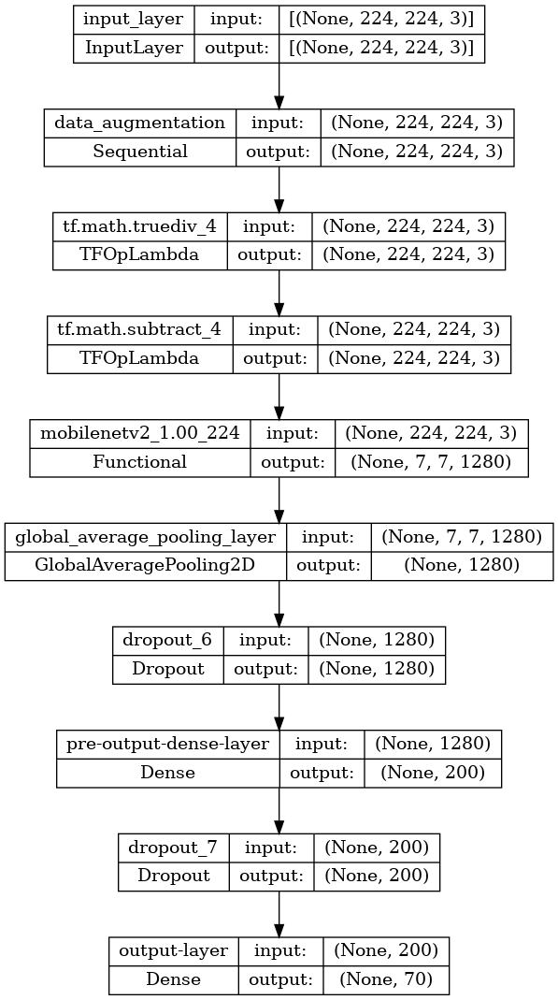

In [174]:
tf.keras.utils.plot_model(model_0, show_shapes=True)

# Compile

In [175]:
# 9. Compile the model

# LEARNING_RATE = 0.0001 # For 4 classes
# LEARNING_RATE = 0.001 # For 70 classes
LEARNING_RATE = 0.0005 # For 70 classes

model_0.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
                metrics = ["accuracy"])

In [176]:
loss0, accuracy0 = model_0.evaluate(test_data)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

182/182 [==============================] - 12s 60ms/step - loss: 4.4882 - accuracy: 0.0110
initial loss: 4.49
initial accuracy: 0.01


# Train

In [177]:
# Weigh classes by number of entries
from collections import Counter

counter = Counter(train_data.classes)
max_val = float(max(counter.values()))
class_weights = {class_id: max_val/num_images for class_id, num_images in counter.items()}
print('Training dataset')
for class_id, group_name in enumerate(group_names):
    print(f'Class #{class_id} - {group_name} : {counter[class_id]} entries, class weight {class_weights[class_id] :.2f}')

Training dataset
Class #0 - Albatross : 82 entries, class weight 8.24
Class #1 - Ani : 28 entries, class weight 24.14
Class #2 - Auklet : 109 entries, class weight 6.20
Class #3 - Blackbird : 109 entries, class weight 6.20
Class #4 - Bobolink : 28 entries, class weight 24.14
Class #5 - Bunting : 82 entries, class weight 8.24
Class #6 - Cardinal : 28 entries, class weight 24.14
Class #7 - Catbird : 55 entries, class weight 12.29
Class #8 - Chat : 28 entries, class weight 24.14
Class #9 - Cormorant : 82 entries, class weight 8.24
Class #10 - Cowbird : 55 entries, class weight 12.29
Class #11 - Creeper : 28 entries, class weight 24.14
Class #12 - Crow : 55 entries, class weight 12.29
Class #13 - Cuckoo : 82 entries, class weight 8.24
Class #14 - Finch : 55 entries, class weight 12.29
Class #15 - Flicker : 28 entries, class weight 24.14
Class #16 - Flycatcher : 190 entries, class weight 3.56
Class #17 - Frigatebird : 28 entries, class weight 24.14
Class #18 - Fulmar : 28 entries, class wei

In [178]:
initial_epochs = 20
# model_0.reset_states()
history = model_0.fit(train_data,
                        epochs=initial_epochs,
                        steps_per_epoch = len(train_data),
                        validation_data = val_data,
                        validation_steps = int(0.25*len(val_data)),
                        class_weight=class_weights)

Epoch 1/20
171/171 [==============================] - 14s 63ms/step - loss: 31.6113 - accuracy: 0.1321 - val_loss: 2.4487 - val_accuracy: 0.3047
Epoch 2/20
171/171 [==============================] - 11s 65ms/step - loss: 20.1133 - accuracy: 0.3044 - val_loss: 1.9758 - val_accuracy: 0.3906
Epoch 3/20
171/171 [==============================] - 11s 64ms/step - loss: 17.3756 - accuracy: 0.3622 - val_loss: 1.6440 - val_accuracy: 0.4844
Epoch 4/20
171/171 [==============================] - 11s 63ms/step - loss: 15.1192 - accuracy: 0.4145 - val_loss: 1.6126 - val_accuracy: 0.5078
Epoch 5/20
171/171 [==============================] - 11s 62ms/step - loss: 14.0677 - accuracy: 0.4398 - val_loss: 1.7668 - val_accuracy: 0.4609
Epoch 6/20
171/171 [==============================] - 11s 65ms/step - loss: 13.3600 - accuracy: 0.4610 - val_loss: 1.5972 - val_accuracy: 0.5000
Epoch 7/20
171/171 [==============================] - 11s 64ms/step - loss: 13.1157 - accuracy: 0.4581 - val_loss: 1.6691 - val_ac

In [179]:
model_0.evaluate(test_data)

182/182 [==============================] - 11s 62ms/step - loss: 1.3375 - accuracy: 0.5939


[1.3374511003494263, 0.5938902497291565]

In [180]:
def plot_loss_curves(history):

  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))
  plt.figure(figsize=(10,5)) 

  #plot loss
  plt.subplot(121)
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.subplot(122)
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

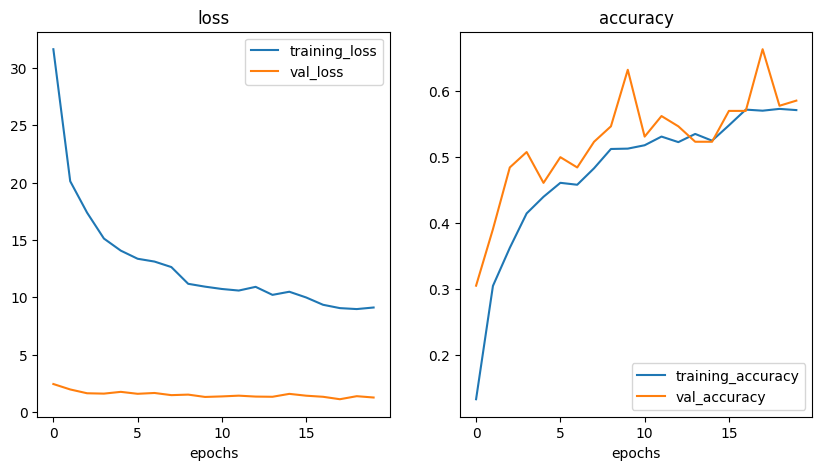

In [181]:
plot_loss_curves(history)

In [182]:
result = model_0.predict(test_images[0:1,:,:,:])
print(result.shape)
print(result[0,:].argmax())
# plt.plot(result[0,:])
# 27 is best guess
print(labels.shape)
print(labels[0].argmax())


1/1 [==============================] - 1s 576ms/step
(1, 70)
3
(32, 70)
16


# Freeze top layers

In [209]:
# To begin fine-tuning lets start by setting the last 10 layers as trainable

# Make all of model trainable
base_model.trainable = True

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all but last layers
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

# Recompile (we have to compile model every time there is a change)
model_0.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE * 0.01), # when fine-tuning you typically want to lower lr by 10x
                 metrics = ["accuracy"] )

In [210]:
# Check which layers are trainable
for layer_number, layer in enumerate(base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_5 False
1 Conv1 False
2 bn_Conv1 False
3 Conv1_relu False
4 expanded_conv_depthwise False
5 expanded_conv_depthwise_BN False
6 expanded_conv_depthwise_relu False
7 expanded_conv_project False
8 expanded_conv_project_BN False
9 block_1_expand False
10 block_1_expand_BN False
11 block_1_expand_relu False
12 block_1_pad False
13 block_1_depthwise False
14 block_1_depthwise_BN False
15 block_1_depthwise_relu False
16 block_1_project False
17 block_1_project_BN False
18 block_2_expand False
19 block_2_expand_BN False
20 block_2_expand_relu False
21 block_2_depthwise False
22 block_2_depthwise_BN False
23 block_2_depthwise_relu False
24 block_2_project False
25 block_2_project_BN False
26 block_2_add False
27 block_3_expand False
28 block_3_expand_BN False
29 block_3_expand_relu False
30 block_3_pad False
31 block_3_depthwise False
32 block_3_depthwise_BN False
33 block_3_depthwise_relu False
34 block_3_project False
35 block_3_project_BN False
36 block_4_expand False
37 block_4_expa

In [211]:

# Now we have unfrozen some of the layers on the top 
print(len(model_0.trainable_variables))

58


# Fine tune refit

In [212]:
initial_epochs = history.epoch[-1]
fine_tune_epochs = initial_epochs + 20

# Refit the model
history_2 = model_0.fit(train_data,
                       epochs = fine_tune_epochs,
                       validation_data = val_data,
                       validation_steps = int(0.25*len(val_data)),
                       class_weight=class_weights,
                       initial_epoch =  history.epoch[-1],) # Start the epoch where it left before

Epoch 20/39
171/171 [==============================] - 18s 65ms/step - loss: 1.8959 - accuracy: 0.8475 - val_loss: 0.8817 - val_accuracy: 0.7422
Epoch 21/39
171/171 [==============================] - 11s 62ms/step - loss: 1.9095 - accuracy: 0.8472 - val_loss: 0.8040 - val_accuracy: 0.7891
Epoch 22/39
171/171 [==============================] - 11s 63ms/step - loss: 1.8851 - accuracy: 0.8587 - val_loss: 0.9442 - val_accuracy: 0.7188
Epoch 23/39
171/171 [==============================] - 11s 63ms/step - loss: 1.8227 - accuracy: 0.8512 - val_loss: 0.8620 - val_accuracy: 0.7812
Epoch 24/39
171/171 [==============================] - 11s 63ms/step - loss: 1.8735 - accuracy: 0.8508 - val_loss: 0.7942 - val_accuracy: 0.7969
Epoch 25/39
171/171 [==============================] - 11s 65ms/step - loss: 1.7509 - accuracy: 0.8540 - val_loss: 1.1489 - val_accuracy: 0.6953
Epoch 26/39
171/171 [==============================] - 11s 64ms/step - loss: 1.7818 - accuracy: 0.8567 - val_loss: 0.9412 - val_ac

In [213]:
model_0.evaluate(test_data)

182/182 [==============================] - 11s 62ms/step - loss: 0.8081 - accuracy: 0.7660


[0.8080727458000183, 0.7659648060798645]

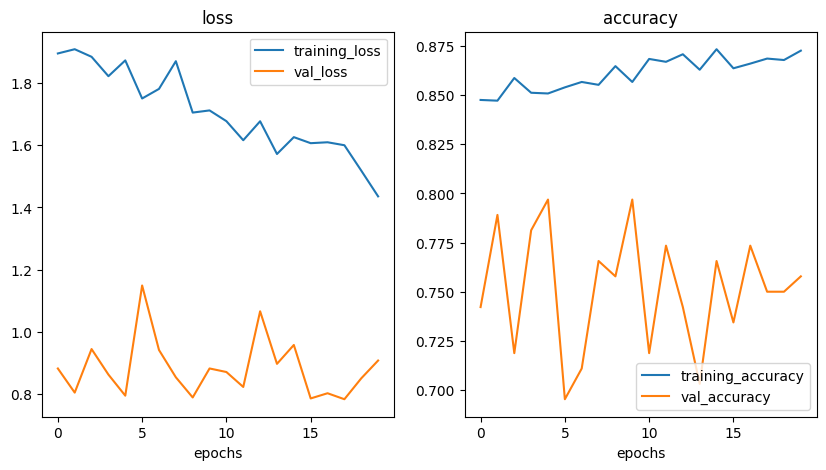

In [214]:
plot_loss_curves(history_2)

In [215]:
idx = 0
result = model_0.predict(test_images[idx:idx+1,:,:,:])
# print(result.shape)
guessed = result[0,:].argmax()
# print(guessed)
# print(labels.shape)
actual = labels[idx,:].argmax()
# print(actual)
print(f'Guessed {group_names[guessed]} vs {group_names[actual]}')

1/1 [==============================] - 1s 548ms/step
Guessed Jay vs Flycatcher


# Predict

1/1 [==============================] - 0s 20ms/step


(1, 70)
67
Guessed Woodpecker


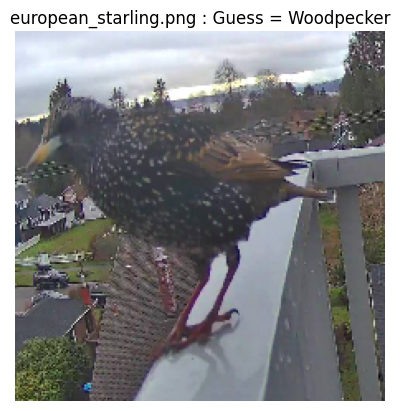

In [216]:
def guess_for_image(img_path):
    # expecting [0,299,299,3] image
    # img = mpimg.imread(img_path)
    # img_size = 224
    raw_img = load_img(img_path, target_size=(img_size, img_size))
    
    img = img_to_array(raw_img)
    
    # img = preprocess_input(img) # Preprocess the image already happens
    
    img_data = np.expand_dims(img, axis=0)
    result = model_0.predict(img_data)
    print(result.shape)
    guessed = result[0,:].argmax()
    print(guessed)
    print(f'Guessed {group_names[guessed]}')
    plt.imshow(raw_img)
    plt.title(f'{os.path.basename(img_path)} : Guess = {group_names[guessed]}')
    plt.axis('off')


# try_img_path = "./data/train/Crow/American_Crow_0025_25522.jpg"
# try_img_path = "./data/train/Crow/American_Crow_0132_25704.jpg"
# try_img_path = "./data/val/Grebe/Horned_Grebe_0011_34687.jpg"
# try_img_path = "./birbcam_thumnails_180/thumbnail_8.png"
# try_img_path = "cat.jpg"
# try_img_path = "sparrow1.jpg"
try_img_path = "european_starling.png"

guess_for_image(try_img_path)

1/1 [==============================] - 0s 33ms/step


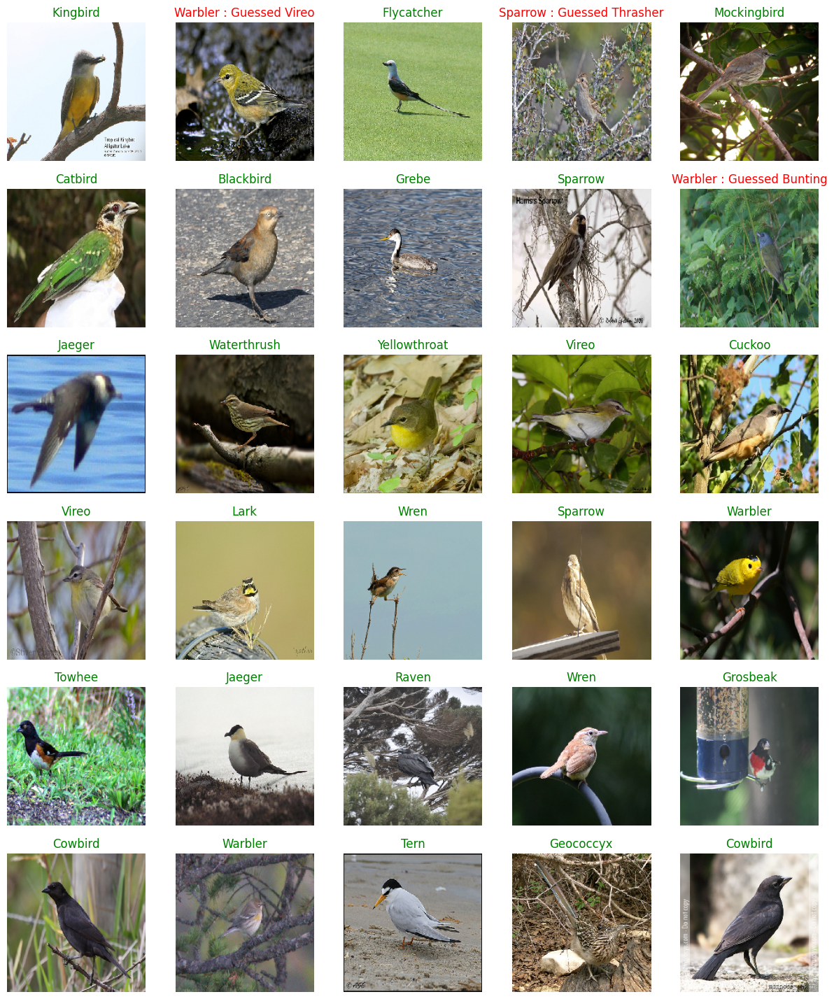

In [220]:
# Select the first image in the batch
test_images, test_labels = next(train_data)

predictions = model_0.predict(test_images)

n_rows = 6
n_cols = 5
plt.figure(figsize=(3*n_cols, 3*n_rows))
for i in range(n_rows*n_cols):
  ax = plt.subplot(n_rows, n_cols, i + 1)
  plt.imshow(test_images[i].astype("uint8"))
  actual = group_names[test_labels[i].argmax()]
  guess = group_names[predictions[i].argmax()]
  if actual == guess:
    plt.title(f'{actual}', color='green')
  else:
    plt.title(f'{actual} : Guessed {guess}', color='red')
  plt.axis("off")

Now predict on the images from the birbcam

In [193]:
# Select the first image in the batch
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

print('Real dataset')
real_dataset  = tf.keras.utils.image_dataset_from_directory("./birbcam_thumnails_180/",
                                                            labels=None,
                                                            shuffle=False,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            color_mode='rgb')

Real dataset
Found 181 files belonging to 1 classes.


In [194]:
print(group_names)
fun_group_names = ['Larry [Crow]', 'Boris [Finch]', 'Nigel [Junco]', 'Shiela [Sparrow]']
print(fun_group_names)
if len(fun_group_names) != len(group_names):
    fun_group_names = group_names
    print(fun_group_names)

['Albatross', 'Ani', 'Auklet', 'Blackbird', 'Bobolink', 'Bunting', 'Cardinal', 'Catbird', 'Chat', 'Cormorant', 'Cowbird', 'Creeper', 'Crow', 'Cuckoo', 'Finch', 'Flicker', 'Flycatcher', 'Frigatebird', 'Fulmar', 'Gadwall', 'Geococcyx', 'Goldfinch', 'Grackle', 'Grebe', 'Grosbeak', 'Guillemot', 'Gull', 'Hummingbird', 'Jaeger', 'Jay', 'Junco', 'Kingbird', 'Kingfisher', 'Kittiwake', 'Lark', 'Loon', 'Mallard', 'Meadowlark', 'Merganser', 'Mockingbird', 'Nighthawk', 'Nutcracker', 'Nuthatch', 'Oriole', 'Ovenbird', 'Pelican', 'Pewee', 'Pipit', 'Puffin', 'Raven', 'Redstart', 'Sayornis', 'Shrike', 'Sparrow', 'Starling', 'Swallow', 'Tanager', 'Tern', 'Thrasher', 'Towhee', 'Violetear', 'Vireo', 'Warbler', 'Waterthrush', 'Waxwing', 'Widow', 'Will', 'Woodpecker', 'Wren', 'Yellowthroat']
['Larry [Crow]', 'Boris [Finch]', 'Nigel [Junco]', 'Shiela [Sparrow]']
['Albatross', 'Ani', 'Auklet', 'Blackbird', 'Bobolink', 'Bunting', 'Cardinal', 'Catbird', 'Chat', 'Cormorant', 'Cowbird', 'Creeper', 'Crow', 'Cuckoo

In [195]:
# Get and predict on all batches in the dataset
all_predictions = []
all_images = []
for images in real_dataset:
    all_predictions.append(model_0.predict(images))
    all_images.append(images)
# Concat the list of batches together
all_predictions = np.concatenate(all_predictions)
all_images = np.concatenate(all_images)
print(f'all_predictions shape: {all_predictions.shape}')
print(f'all_images shape: {all_images.shape}')
# All predictions is a NUM_ENTRIES x CLASS_COUNT with probability for each

1/1 [==============================] - 0s 59ms/step
all_predictions shape: (181, 70)
all_images shape: (181, 224, 224, 3)


In [196]:
# Count number of predictions of each class
top_predictions = all_predictions.argmax(axis=1)
class_prediction_counts = Counter(top_predictions)
for idx, count in class_prediction_counts.items():
    print(f'{group_names[idx]} : {count}')

Kingbird : 1
Kingfisher : 2
Mockingbird : 11
Crow : 20
Cowbird : 28
Blackbird : 2
Towhee : 4
Wren : 7
Grackle : 12
Cardinal : 8
Vireo : 1
Thrasher : 11
Goldfinch : 8
Swallow : 2
Flycatcher : 4
Albatross : 3
Finch : 11
Frigatebird : 10
Oriole : 6
Gull : 3
Waxwing : 13
Jaeger : 2
Ani : 4
Flicker : 1
Raven : 2
Cormorant : 1
Cuckoo : 2
Lark : 2


In [197]:
def get_filepath_from_image_idx(idx, dataset):
    # Requires dataset to not be shuffled
    # os.path.splitext(os.path.basename(dataset.file_paths[idx]))[0]
    return dataset.file_paths[idx]

get_filepath_from_image_idx(137, real_dataset)

'./birbcam_thumnails_180/thumbnail_6.png'

n_rows x n_cols = 6 x 6 = 36


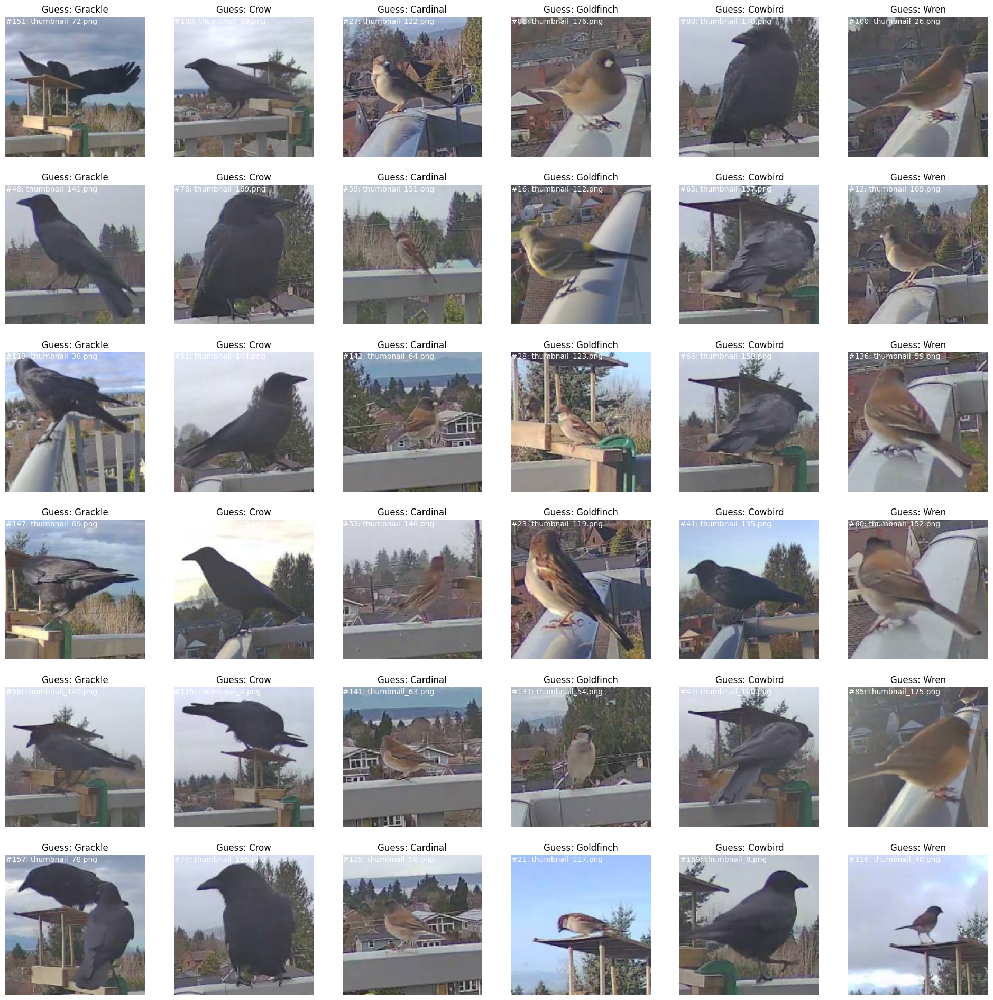

In [199]:
# Take random predictions of each category prediction and plot NxN grid of them
n_rows = 6 #min(20, min(class_prediction_counts.values()))
n_cols = 6 # num of classes
plt.figure(figsize=(4*n_cols, 4*n_rows))

# Get classes that have enough predictions >= n_rows
# class_ids = np.arange(n_rows)
valid_class_idxs = [class_idx for class_idx, count in class_prediction_counts.items() if count >= n_rows]
# Choose a subset of those idxs to match exactly = n_rows
class_ids = np.random.choice(valid_class_idxs, n_rows, replace=False)

print(f'n_rows x n_cols = {n_rows} x {n_cols} = {n_rows * n_cols}')
for col in range(n_cols):
  #class_id = col
  class_id = class_ids[col]
  class_id_predicted_idxs = np.argwhere(top_predictions == class_id).flatten()
  chosen_idxs = np.random.choice(class_id_predicted_idxs, size=n_rows, replace=False)
  for row in range(n_rows):
    i = n_cols*row + col
    # print(f'i={i} row/col = {row}, {col}')
    ax = plt.subplot(n_rows, n_cols, i + 1)
    chosen_idx = chosen_idxs[row]

    image = all_images[chosen_idx]
    plt.imshow(image.astype("uint8"))
    guess = fun_group_names[top_predictions[chosen_idx]]
    plt.title(f'Guess: {guess}')
    plt.text(0,10,f'#{chosen_idx}: {os.path.basename(get_filepath_from_image_idx(chosen_idx, real_dataset))}', color='white')
    plt.axis("off")

1/1 [==============================] - 0s 37ms/step


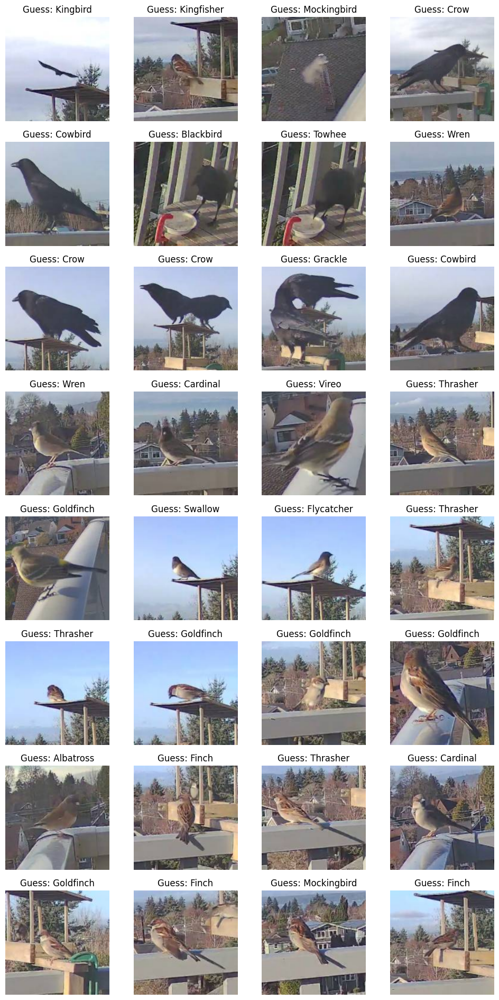

In [204]:
rows = 8
cols = 4
plt.figure(figsize=(3*cols, 3*rows))

for images in real_dataset.take(1):
  predictions = model_0.predict(images)
  
  for i in range(rows*cols):
    ax = plt.subplot(rows, cols, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    top_ind = np.argsort(predictions[i])[-3:]
    # guesses = [f'{group_names[ind]}:{100.0*predictions[i][ind]:.0f}%' for ind in reversed(top_ind)]
    # guesses = ','.join(guesses)
    # plt.title(f'Guess {guesses}')
    # best_guess_percent = 100.0 * predictions[i][top_ind[-1]]
    guess = fun_group_names[predictions[i].argmax()]
    plt.title(f'Guess: {guess}')
    plt.axis("off")

  # # Plot of all class predictions percents
  # plt.figure(figsize=(20, 20))
  # for i in range(rows*cols):
  #   ax = plt.subplot(rows, cols, i + 1)
  #   # plt.imshow(images[i].numpy().astype("uint8"))
  #   plt.plot(predictions[i], '.-')
  #   guess = group_names[predictions[i].argmax()]
  #   # guess = group_names[predictions[i].argmax()]
  #   plt.title(f'Guess {guess} : {predictions[i][predictions[i].argmax()]:.2f}')
  #   plt.axis("off")

# Freeze model for later

In [ ]:
model_0.save('bird_classify_70_species_80percent_v2.keras')

Build TFlite model

In [5]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmpsfn_vtvg/assets


INFO:tensorflow:Assets written to: /tmp/tmpsfn_vtvg/assets
2024-01-05 20:30:31.338698: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:378] Ignored output_format.
2024-01-05 20:30:31.338735: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:381] Ignored drop_control_dependency.
Summary on the non-converted ops:
---------------------------------
 * Accepted dialects: tfl, builtin, func
 * Non-Converted Ops: 110, Total Ops 184, % non-converted = 59.78 %
 * 110 ARITH ops

- arith.constant:  110 occurrences  (f32: 108, i32: 2)



  (f32: 10)
  (f32: 35)
  (f32: 17)
  (f32: 1)
  (f32: 1)
  (f32: 1)
  (f32: 4)
  (f32: 1)
  (f32: 1)


In [6]:
# Save the model.
with open('birb_model_v1.tflite', 'wb') as f:
    f.write(tflite_model)

Save TensorflowJS

In [9]:
import tensorflowjs as tfjs
tfjs.converters.save_keras_model(model, 'tfjs_bird_70_v1')

/home/sam/birb1/venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Load model

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import Counter
import numpy as np
import random
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
import tensorflow as tf
from keras.preprocessing.image import load_img, img_to_array

2024-01-06 16:43:43.340549: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-06 16:43:43.340602: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-06 16:43:43.341576: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-06 16:43:44.031865: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [5]:
# Load the model
# model = model_0
# model = tf.keras.models.load_model('bird_classify_saved_model_002.keras') # 4 species
model = tf.keras.models.load_model('bird_classify_70_species_80percent.keras') # 70 species

# Show the model architecture
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequent  (None, None, None, None   0         
 ial)                        )                                   
                                                                 
 tf.math.truediv_3 (TFOpLam  (None, 224, 224, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_3 (TFOpLa  (None, 224, 224, 3)       0         
 mbda)                                                           
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                   

Test on some images

Found 181 files belonging to 1 classes.
1/1 [==============================] - 1s 898ms/step


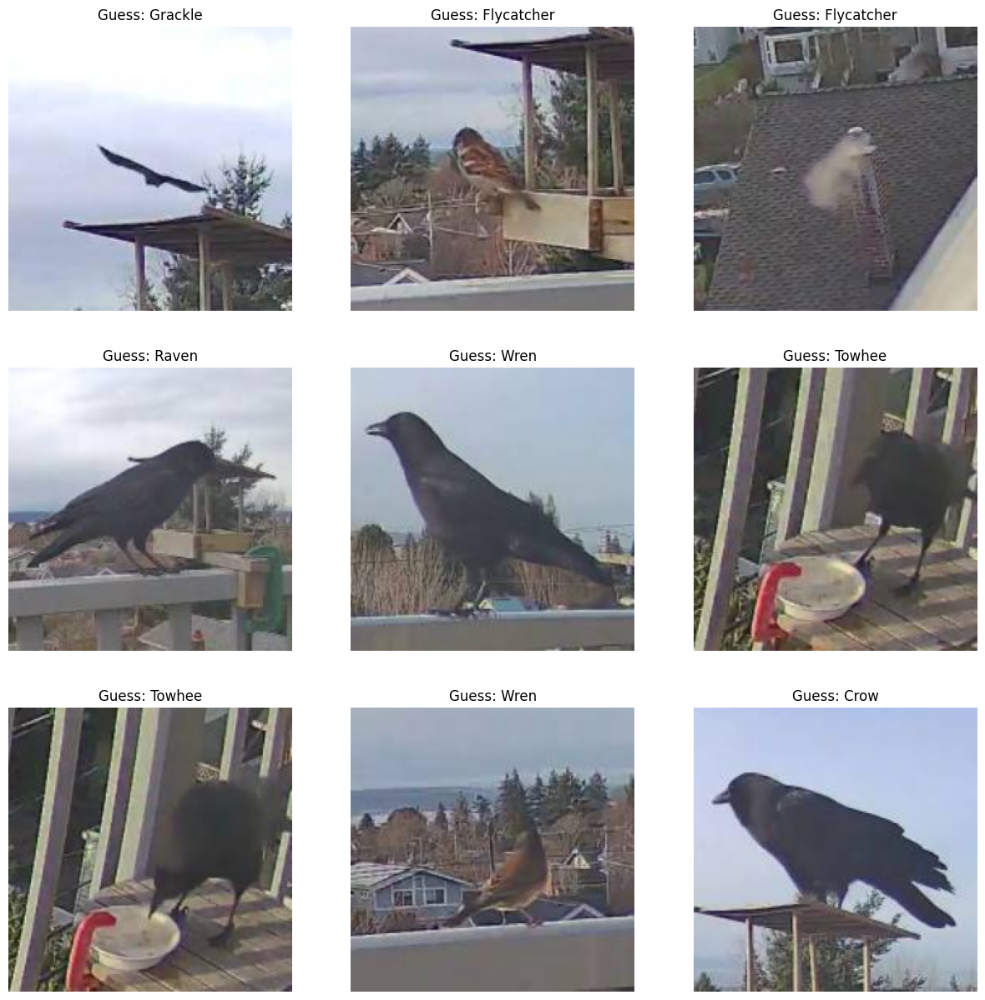

In [6]:
# Select the first image in the batch
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

real_dataset  = tf.keras.utils.image_dataset_from_directory("./birbcam_thumnails_180/",
                                                            labels=None,
                                                            shuffle=False,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            color_mode='rgb')

# 4 species
# fun_group_names = ['Larry [Crow]', 'Boris [Finch]', 'Nigel [Junco]', 'Shiela [Sparrow]']
# 70 species
fun_group_names = ['Albatross', 'Ani', 'Auklet', 'Blackbird', 'Bobolink', 'Bunting', 'Cardinal', 'Catbird', 'Chat', 'Cormorant', 'Cowbird', 'Creeper', 'Crow', 'Cuckoo', 'Finch', 'Flicker', 'Flycatcher', 'Frigatebird', 'Fulmar', 'Gadwall', 'Geococcyx', 'Goldfinch', 'Grackle', 'Grebe', 'Grosbeak', 'Guillemot', 'Gull', 'Hummingbird', 'Jaeger', 'Jay', 'Junco', 'Kingbird', 'Kingfisher', 'Kittiwake', 'Lark', 'Loon', 'Mallard', 'Meadowlark', 'Merganser', 'Mockingbird', 'Nighthawk', 'Nutcracker', 'Nuthatch', 'Oriole', 'Ovenbird', 'Pelican', 'Pewee', 'Pipit', 'Puffin', 'Raven', 'Redstart', 'Sayornis', 'Shrike', 'Sparrow', 'Starling', 'Swallow', 'Tanager', 'Tern', 'Thrasher', 'Towhee', 'Violetear', 'Vireo', 'Warbler', 'Waterthrush', 'Waxwing', 'Widow', 'Will', 'Woodpecker', 'Wren', 'Yellowthroat']

rows = 3
cols = 3
plt.figure(figsize=(5*cols, 5*rows))

for images in real_dataset.take(1):
  predictions = model.predict(images)
  
  for i in range(rows*cols):
    ax = plt.subplot(rows, cols, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    top_ind = np.argsort(predictions[i])[-3:]
    guess = fun_group_names[predictions[i].argmax()]
    plt.title(f'Guess: {guess}')
    plt.axis("off")

# Updating Frigate events

In [53]:
!curl -X POST -H "Content-Type: application/json" -d '{"subLabel": "Nigel [Junco]"}' http://sambee:5000//api/events/1704480933.547032-1rxqns/sub_label

{"message":"Event 1704480933.547032-1rxqns sub label set to Nigel [Junco]","success":true}


`curl -X POST -H "Content-Type: application/json" -d '{"subLabel": "Nigel"}' http://sambee:500
0//api/events/1704480933.547032-1rxqns/sub_label`

Response:
`{"message":"Event 1704480933.547032-1rxqns sub label set to Nigel","success":true}`

In [15]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import Counter
import numpy as np
import glob
import random
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
import tensorflow as tf
from keras.preprocessing.image import load_img, img_to_array
# Load the model
# model = model_0
# model = tf.keras.models.load_model('bird_classify_saved_model_002.keras')

# Show the model architecture
# model.summary()

In [17]:
fun_group_names = ['Larry [Crow]', 'Boris [Finch]', 'Nigel [Junco]', 'Shiela [Sparrow]']

def load_image_from_path(img_path, img_size=224):
  # Load and resize image (as RGB 3-channel)
  raw_img = load_img(img_path, target_size=(img_size, img_size))
  img_array = img_to_array(raw_img)
  return raw_img, img_array

def predict_on_image(img_array, model):
  """
  Loads an image, preprocesses it, and uses the given model to predict its class. 

  Args:
  img_array (np array): The image array to predict on.
  model: The pre-trained model to use for prediction.
  Returns:
  int: The index of the predicted class.
  """
  # Turn into a 1-length batch
  img_data = np.expand_dims(img_array, axis=0)
  # Predict on batch
  result = model.predict(img_data)
  # Get top class prediction for the single entry
  guessed = result[0,:].argmax()
  return guessed

def show_predict_on_image(img_path, model, class_names=fun_group_names):
  """
  Loads an image, preprocesses it, and uses the given model to predict its class. 
  Displays the image with the predicted class as the title.

  Args:
  img_path (str): The path to the image file.
  model: The pre-trained model to use for prediction.
  class_names (list): A list of class names for prediction labels.
  """
  raw_img, img_array = load_image_from_path(img_path)

  # Get prediction
  guessed = predict_on_image(img_array, model)

  # Show image with guess as title
  plt.imshow(raw_img)
  plt.title(f'{os.path.basename(img_path)} : Guess = {class_names[guessed]}')

1/1 [==============================] - 0s 19ms/step


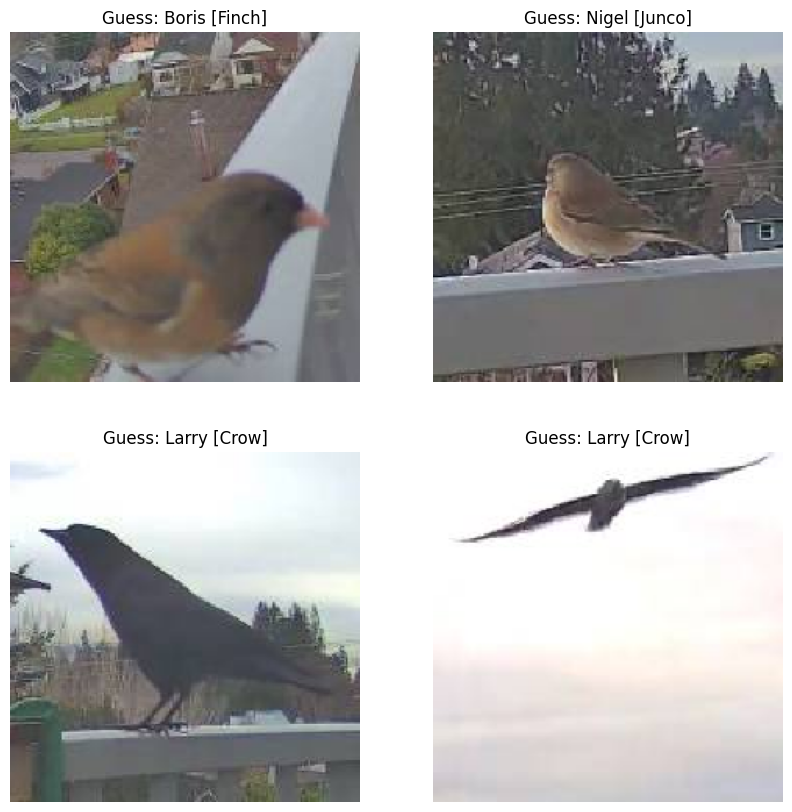

In [18]:
# Test on some images
rows = 2
cols = 2
plt.figure(figsize=(5*cols, 5*rows))

IMG_PATHS_GLOB = "./birbcam_thumnails_180/*"
image_paths = glob.glob(IMG_PATHS_GLOB)
image_paths_selected = np.random.choice(image_paths, rows*cols)

predictions = []
raw_images = []
for img_path in image_paths_selected:
  raw_img, img_array = load_image_from_path(img_path)
  predictions.append(predict_on_image(img_array, model))
  raw_images.append(raw_img)
  
for i in range(rows*cols):
  ax = plt.subplot(rows, cols, i + 1)
  plt.imshow(raw_images[i])
  plt.title(f'Guess: {fun_group_names[predictions[i]]}')
  plt.axis("off")

# # Updating Frigate events
# `curl -X POST -H "Content-Type: application/json" -d '{"subLabel": "Nigel"}' http://sambee:500
# 0//api/events/1704480933.547032-1rxqns/sub_label`

# Response:
# `{"message":"Event 1704480933.547032-1rxqns sub label set to Nigel","success":true}`

In [23]:
!curl -X GET http://sambee:5000//api/events/1704480933.547032-1rxqns

{"area":10062,"box":[1926,416,2043,502],"camera":"birbcam","end_time":1704480948.142282,"false_positive":false,"has_clip":false,"has_snapshot":true,"id":"1704480933.547032-1rxqns","label":"bird","plus_id":null,"ratio":1.3604651162790697,"region":[1824,300,2144,620],"retain_indefinitely":false,"start_time":1704480928.547032,"sub_label":"Nigel","thumbnail":"/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAoHBwgHBgoICAgLCgoLDhgQDg0NDh0VFhEYIx8lJCIfIiEmKzcvJik0KSEiMEExNDk7Pj4+JS5ESUM8SDc9Pjv/2wBDAQoLCw4NDhwQEBw7KCIoOzs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozv/wAARCACvAK8DASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYn

Collect all the json data for last 1000 events

In [42]:
# Last event processed = 1704497447.860246-8xeuab
!curl -X GET http://sambee:5000//api/events/1704497447.860246-8xeuab

# Last time processed = 1704497442.860246

{"area":80106,"box":[598,581,936,818],"camera":"birbcam","end_time":1704497462.459155,"false_positive":false,"has_clip":true,"has_snapshot":true,"id":"1704497447.860246-8xeuab","label":"bird","plus_id":null,"ratio":1.4261603375527425,"region":[495,477,951,933],"retain_indefinitely":false,"start_time":1704497442.860246,"sub_label":"Nigel [Junco]","thumbnail":"/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAoHBwgHBgoICAgLCgoLDhgQDg0NDh0VFhEYIx8lJCIfIiEmKzcvJik0KSEiMEExNDk7Pj4+JS5ESUM8SDc9Pjv/2wBDAQoLCw4NDhwQEBw7KCIoOzs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozv/wAARCACvAK8DASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvA

In [7]:
import requests

after = '1704497442.860246'
url = f"http://sambee:5000/api/events?include_thumbnails=1&cameras=birbcam&limit=1000&after={after}"

response = requests.get(url)
if response.status_code == 200:
    json_data = response.json()
else:
    print("Failed to retrieve data: Status code", response.status_code)
print(json_data)

[{'area': None, 'box': None, 'camera': 'birbcam', 'end_time': None, 'false_positive': None, 'has_clip': True, 'has_snapshot': True, 'id': '1704569939.430136-f7ws88', 'label': 'bird', 'plus_id': None, 'ratio': None, 'region': None, 'retain_indefinitely': False, 'start_time': 1704569934.430136, 'sub_label': None, 'thumbnail': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAoHBwgHBgoICAgLCgoLDhgQDg0NDh0VFhEYIx8lJCIfIiEmKzcvJik0KSEiMEExNDk7Pj4+JS5ESUM8SDc9Pjv/2wBDAQoLCw4NDhwQEBw7KCIoOzs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozs7Ozv/wAARCACvAK8DASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5O

Function to make posts to update sublabels

In [22]:
import requests
import json

def post_sublabel(event_id, sublabel):
    url = f"http://sambee:5000/api/events/{event_id}/sub_label"
    data = {"subLabel": sublabel}
    headers = {"Content-Type": "application/json"}

    response = requests.post(url, data=json.dumps(data), headers=headers)

    if response.status_code == 200:
        return response.json()
    else:
        return f"Failed to post data: Status code {response.status_code}"

# Example usage
# event_id = "1704480933.547032-1rxqns"
# sublabel = "Nigel [Junco]"
# result = post_sublabel(event_id, sublabel)
# print(result)


{'message': 'Event 1704480933.547032-1rxqns sub label set to Nigel [Junco]', 'success': True}


A function to get the image from the json data, predict on it and show the image with prediction for validation

1/1 [==============================] - 0s 20ms/step


Text(0.5, 1.0, '1704560640.762471-ojzfd0 : Guess Larry [Crow]')

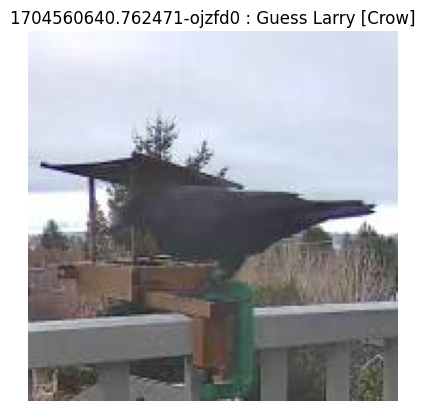

In [19]:
import base64
from PIL import Image
from io import BytesIO
from tensorflow.keras.preprocessing.image import smart_resize


def get_img_from_b64(b64_str):
    image_data = base64.b64decode(b64_str)
    return Image.open(BytesIO(image_data))

event_idx = 13
img_id = json_data[event_idx]['id']
img_thumbnail = get_img_from_b64(json_data[event_idx]['thumbnail'])

guess = predict_on_image(smart_resize(img_thumbnail, (224, 224)), model)

plt.imshow(img_thumbnail)
plt.axis('off')
plt.title(f'{img_id} : Guess {fun_group_names[guess]}')

In [ ]:
# import json
# import base64
# from PIL import Image
# from io import BytesIO

# def save_base64_images(json_file_path, output_folder):
#     # Read JSON file
#     with open(json_file_path, 'r') as file:
#         data = json.load(file)

#     # Process each item in the JSON array
#     for index, item in enumerate(data):
#         if 'thumbnail' in item and item['thumbnail']:
#             # Decode the base64 image
#             image_data = base64.b64decode(item['thumbnail'])
#             image = Image.open(BytesIO(image_data))

#             # Save the image
#             image_file_name = f"{output_folder}/thumbnail_{index}.png"
#             image.save(image_file_name)
#             print(f"Saved {image_file_name}")

# # Example usage
# json_file_path = 'path_to_your_json_file.json'
# output_folder = 'path_to_output_folder'
# save_base64_images(json_file_path, output_folder)


Now a loop over all the events in the pulled json data and update sublabels based on that

In [23]:
import time

for event_idx in range(len(json_data)):
    event_data = json_data[event_idx]
    event_id = event_data['id']
    if "subLabel" in event_data:
        print(f'Skipping labeled {event_id} -> {event_data["subLabel"]}')
        continue

    img_thumbnail = get_img_from_b64(event_data['thumbnail'])
    # Get prediction
    guess = predict_on_image(smart_resize(img_thumbnail, (224, 224)), model)
    guess_str = fun_group_names[guess]
    print(f'{event_idx+1}/{len(json_data)} : Prediction for {event_id} : {guess_str}')
    # POST sub label
    result = post_sublabel(event_id, guess_str)
    print(result)
    time.sleep(0.5)

    # if event_idx > 3:
    #     break


1/1 [==============================] - 0s 19ms/step
1/25 : Prediction for 1704569939.430136-f7ws88 : Nigel [Junco]
{'message': 'Event 1704569939.430136-f7ws88 sub label set to Nigel [Junco]', 'success': True}
1/1 [==============================] - 0s 18ms/step
2/25 : Prediction for 1704569912.730423-sloo3p : Nigel [Junco]
{'message': 'Event 1704569912.730423-sloo3p sub label set to Nigel [Junco]', 'success': True}
1/1 [==============================] - 0s 19ms/step
3/25 : Prediction for 1704569822.731147-3b1kys : Nigel [Junco]
{'message': 'Event 1704569822.731147-3b1kys sub label set to Nigel [Junco]', 'success': True}
1/1 [==============================] - 0s 33ms/step
4/25 : Prediction for 1704569683.134784-crtnvu : Larry [Crow]
{'message': 'Event 1704569683.134784-crtnvu sub label set to Larry [Crow]', 'success': True}
1/1 [==============================] - 0s 25ms/step
5/25 : Prediction for 1704569622.542222-boude6 : Larry [Crow]
{'message': 'Event 1704569622.542222-boude6 sub labe

In [26]:
!curl -X GET http://sambee:5000//api/events/summary

[{"camera":"birbcam","count":1,"day":"2023-11-15","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":2,"day":"2023-11-22","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":2,"day":"2023-11-28","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":3,"day":"2023-12-27","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":8,"day":"2023-12-28","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":27,"day":"2023-12-29","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":13,"day":"2023-12-30","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":25,"day":"2023-12-31","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":12,"day":"2024-01-01","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":7,"day":"2024-01-02","label":"bird","sub_label":null,"zones":[]},{"camera":"birbcam","count":3,"day":"2024-01-03","label":"bird","